In [1]:
from matplotlib import rcParams
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from os import makedirs
from requests import get
from blaseball_mike.database import get_all_teams


pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)

rcParams.update({'figure.autolayout': True})

In [2]:
# Set to folder path
base_url = "https://www.blaseball.com/database/teamElectionStats?id="
teams = get_all_teams()
wills_files = {'_'.join(teams[team]['nickname'].lower().split(
)): team for team in teams if teams[team]['stadium'] is not None}
will_names = {
    'alternate_trust': 'Alternate Trust',
    'equivalent_exchange': 'Exchange',
    'idols_steal': 'Plunder',
    'mod_reroll': 'Reform',
    'player_boost_targeted': 'Transfuse',
    'player_move': 'Move',
    'season_team_mod': 'Enrich',
    'shadows_call_up': 'Foreshadow'
}

wills_votes = [pd.DataFrame(get(f'{base_url}{wills_files[key]}').json()[
                            'wills']) for key in wills_files]

In [3]:
for team in wills_files:
    try:
        makedirs(f'./plots/{team}')
    except:
        pass

In [4]:
wills_values = {key: None for key in wills_files}

for i, key in enumerate(wills_files):
    wills_votes[i]['percent'] = wills_votes[i]['percent'].astype('float')

    if wills_votes[i]['percent'].sum() != 1:
        wills_votes[i].loc[wills_votes[i]['percent'] == wills_votes[i]['percent'].max(
        ), 'percent'] += 100*(1 - wills_votes[i]['percent'].sum()/100)

    wills_votes[i]['team'] = key
    wills_votes[i]['will'] = wills_votes[i]['id'].map(will_names)

    wills_values[key] = {
        will: odds for will, odds in zip(wills_votes[i]['will'], wills_votes[i]['percent'])
    }

100.1
100.0
100.1
100.0
99.9
99.99999999999999
100.0
100.0
100.1
100.00000000000001
99.89999999999999
100.0
100.0
100.0
99.89999999999999
100.0
100.1
100.0
100.1
100.0
100.0
100.0
100.0
100.0
100.0
100.0
99.9
99.99999999999999
100.0
100.0
100.0
100.0
99.9
100.0
99.9
100.0
99.9
100.0
100.1
100.00000000000003
100.0
100.0
100.0
100.0
100.1
100.00000000000003
100.10000000000001
99.99999999999999


In [5]:
def draw_wills(wills):
    ps = pd.Series(list(wills.values()))/100
    return np.random.choice(list(wills.keys()), 2, False, ps)

In [6]:
def will_sim(will_dict, n_draws=100_000):

    draws = {
        'will_1': [],
        'will_2': []
    }

    for i in range(1, n_draws+1):
        wills = draw_wills(will_dict)
        wills.sort()
        draws['will_1'].append(wills[0])
        draws['will_2'].append(wills[1])

        if i % (n_draws // 4) == 0:
            print(f'Simulation {i}...')

    return pd.DataFrame(draws)

In [7]:
all_draws = []

for i, will_dict in enumerate(wills_values.values()):
    print(f'Team {i+1} of {len(wills_values.values())}')
    all_draws.append(will_sim(will_dict))

Team 1 of 24
Simulation 25000...
Simulation 50000...
Simulation 75000...
Simulation 100000...
Team 2 of 24
Simulation 25000...
Simulation 50000...
Simulation 75000...
Simulation 100000...
Team 3 of 24
Simulation 25000...
Simulation 50000...
Simulation 75000...
Simulation 100000...
Team 4 of 24
Simulation 25000...
Simulation 50000...
Simulation 75000...
Simulation 100000...
Team 5 of 24
Simulation 25000...
Simulation 50000...
Simulation 75000...
Simulation 100000...
Team 6 of 24
Simulation 25000...
Simulation 50000...
Simulation 75000...
Simulation 100000...
Team 7 of 24
Simulation 25000...
Simulation 50000...
Simulation 75000...
Simulation 100000...
Team 8 of 24
Simulation 25000...
Simulation 50000...
Simulation 75000...
Simulation 100000...
Team 9 of 24
Simulation 25000...
Simulation 50000...
Simulation 75000...
Simulation 100000...
Team 10 of 24
Simulation 25000...
Simulation 50000...
Simulation 75000...
Simulation 100000...
Team 11 of 24
Simulation 25000...
Simulation 50000...
Simul

In [9]:
def get_tables(draws):
    will_1_freq = pd.Series(draws.groupby('will_1').size()) / draws.shape[0]
    will_1_freq = will_1_freq.sort_values(ascending=False)

    wills = pd.DataFrame(draws.groupby(['will_1'])[
                         'will_2'].value_counts(normalize=True))
    wills.columns = ['prob']
    wills = wills.sort_values('prob', ascending=False)
    wills['will1_prob'] = wills.index.map(lambda x: will_1_freq[x[0]])
    wills['relative_prob'] = wills['prob'] * wills['will1_prob']
    wills = wills.sort_values('relative_prob', ascending=False).drop(
        columns=['prob', 'will1_prob'])
    wills.reset_index(inplace=True)
    wills['will_combo'] = wills['will_1'] + ' + ' + wills['will_2']

    overall_probs = {}
    for outcome in set(wills['will_1']).union(set(wills['will_2'])):
        overall_probs[outcome] = round(wills[(wills['will_1'] == outcome) | (
            wills['will_2'] == outcome)]['relative_prob'].sum(), 4)

    overall_probs_df = pd.DataFrame.from_dict(
        {key: [value] for key, value in overall_probs.items()}, orient='index')
    overall_probs_df.columns = ['prob']
    overall_probs_df = overall_probs_df.sort_values('prob', ascending=False)

    return wills, overall_probs_df


def gen_plots(wills, overall_probs_df, team):
    team_name = ' '.join(word.capitalize() for word in team.split('_'))

    sns.set_style('darkgrid')
    sns.set_palette('pastel')

    plt.figure(figsize=(16, 13))
    sns.barplot(data=overall_probs_df, x='prob',
                y=overall_probs_df.index, orient='h')
    plt.yticks(rotation=22.5, fontsize='20')
    plt.xlabel('Probability of Outcome', fontsize='20')
    plt.ylabel('Outcome', fontsize='20')
    plt.title(
        f'{team_name}: Overall Likelihood of Individual Will', fontsize='25')
    plt.xticks(
        [.01, .05, .10, .15, .20, .25, .30, .35, .40, .45, .50, .60, .70, .80, .90, 1])
    plt.xlim(0, 1)
    plt.savefig(f'./plots/{team}/Wills_Individual_2_{team}.png', format='png')

    plt.figure(figsize=(16, 13))
    sns.barplot(data=wills, x='relative_prob',
                y=wills['will_combo'], orient='h')
    plt.yticks(rotation=22.5, fontsize='20')
    plt.xlabel('Probability of Outcome', fontsize='20')
    plt.ylabel('Outcome', fontsize='20')
    plt.title(f'{team_name}: Overall Likelihood of Will Pair', fontsize='25')
    plt.xticks(
        [.01, .05, .10, .15, .20, .25, .30, .35, .40, .45, .50, .60, .70, .80, .90, 1])
    plt.xlim(0, 1)
    plt.savefig(f'./plots/{team}/Will_Pairs_2_{team}.png', format='png')

    plt.figure(figsize=(16, 13))
    sns.barplot(data=wills.iloc[1:, :], x='relative_prob',
                y=wills['will_combo'][1:], orient='h')
    plt.yticks(rotation=22.5, fontsize='20')
    plt.xlabel('Probability of Outcome (Scale: 0-20%)', fontsize='20')
    plt.ylabel('Outcome', fontsize='20')
    plt.title(
        f'{team_name}: Overall Likelihood of Non-Guide Will Pairs (Zoom-in)', fontsize='25')
    plt.xticks([.01, .05, .10, .15, .20])
    plt.xlim(0, .2)
    plt.savefig(
        f'./plots/{team}/Will_Pairs_Off_Plan_2_{team}.png', format='png')

In [10]:
def main():

    all_draws = []

    for i, will_dict in enumerate(wills_values.values()):
        print(f'Team {i+1} of {len(wills_values.values())}')
        all_draws.append(will_sim(will_dict))

    for i, team in enumerate(wills_files):
        wills, overall_probs_df = get_tables(all_draws[i])

        gen_plots(wills, overall_probs_df, team)

        wills.to_csv(f'./data/{team}_wills.csv', index=None)

<ipython-input-9-bc4ae199ca12>:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,13))


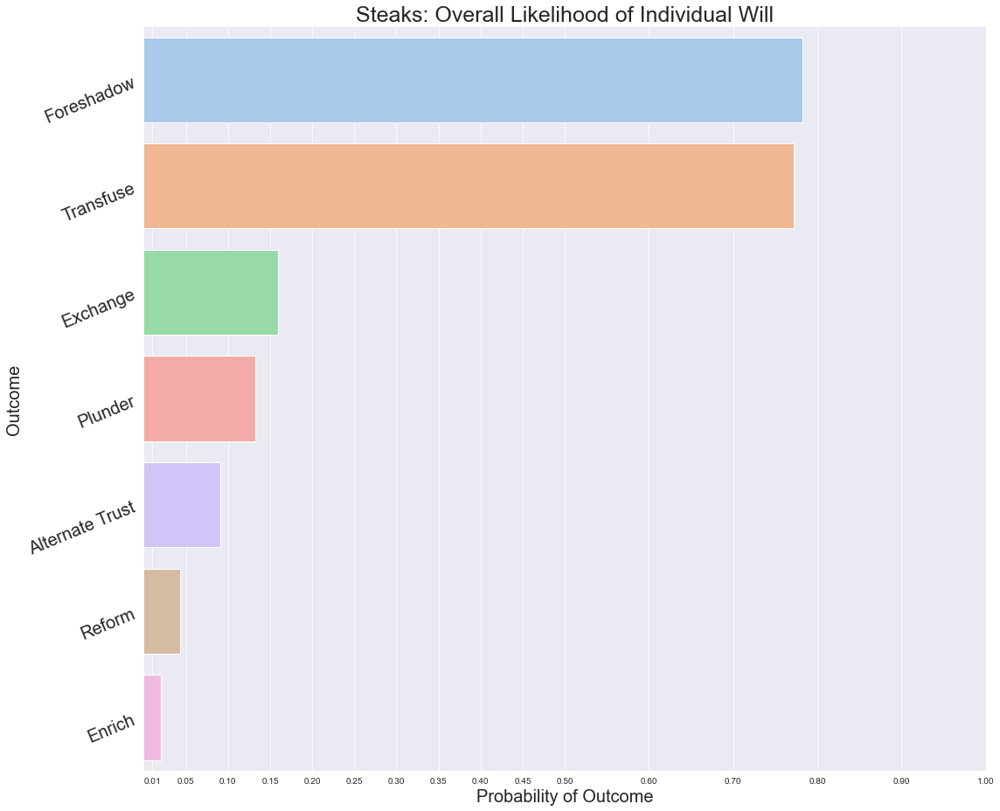

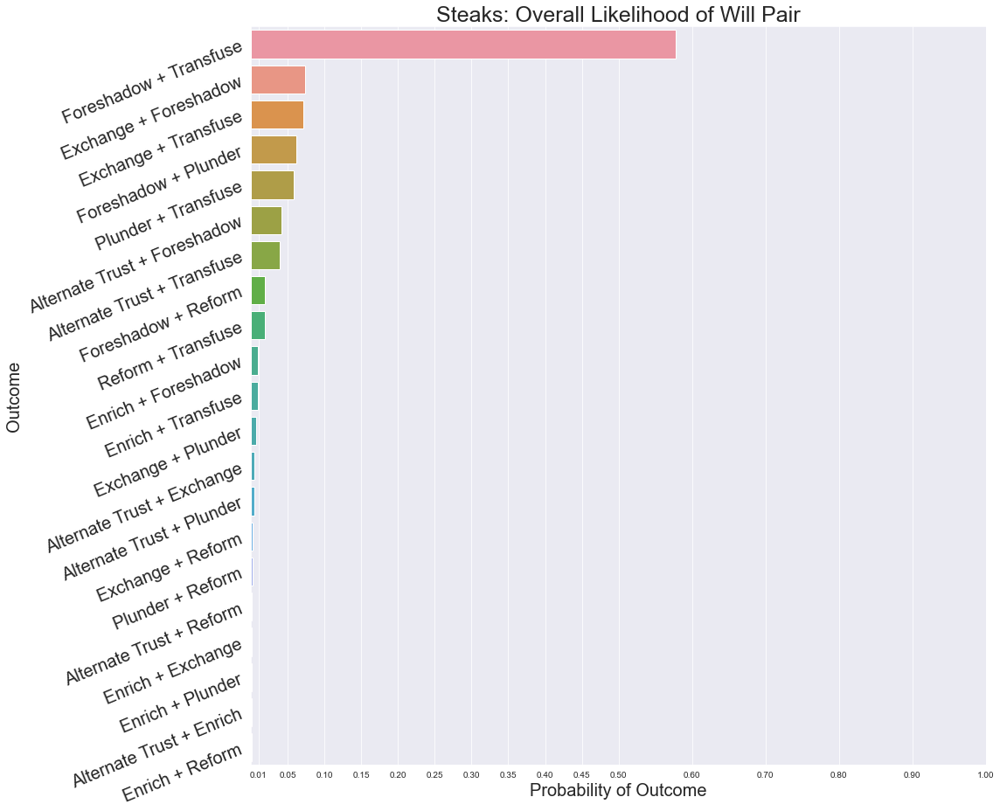

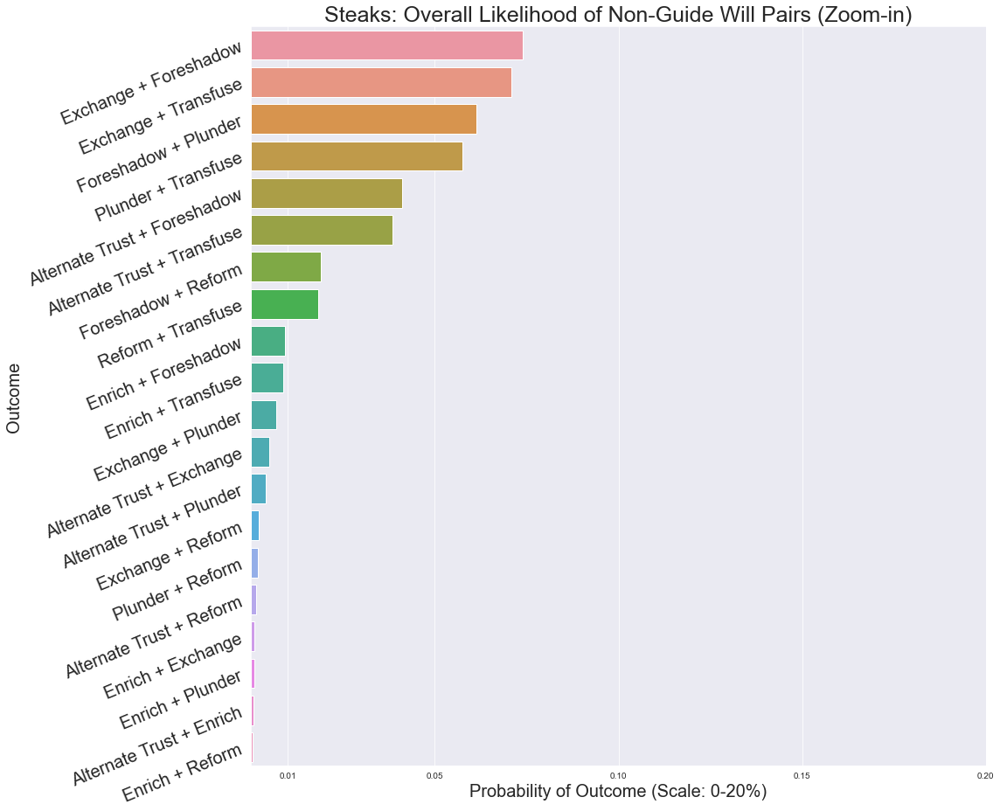

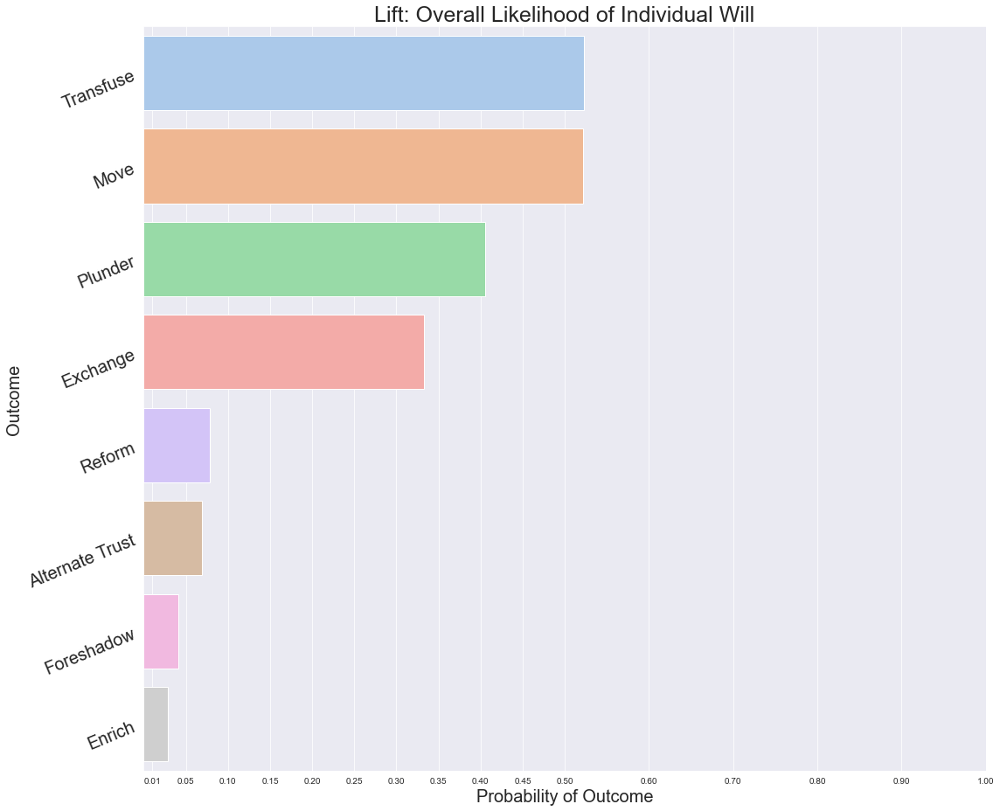

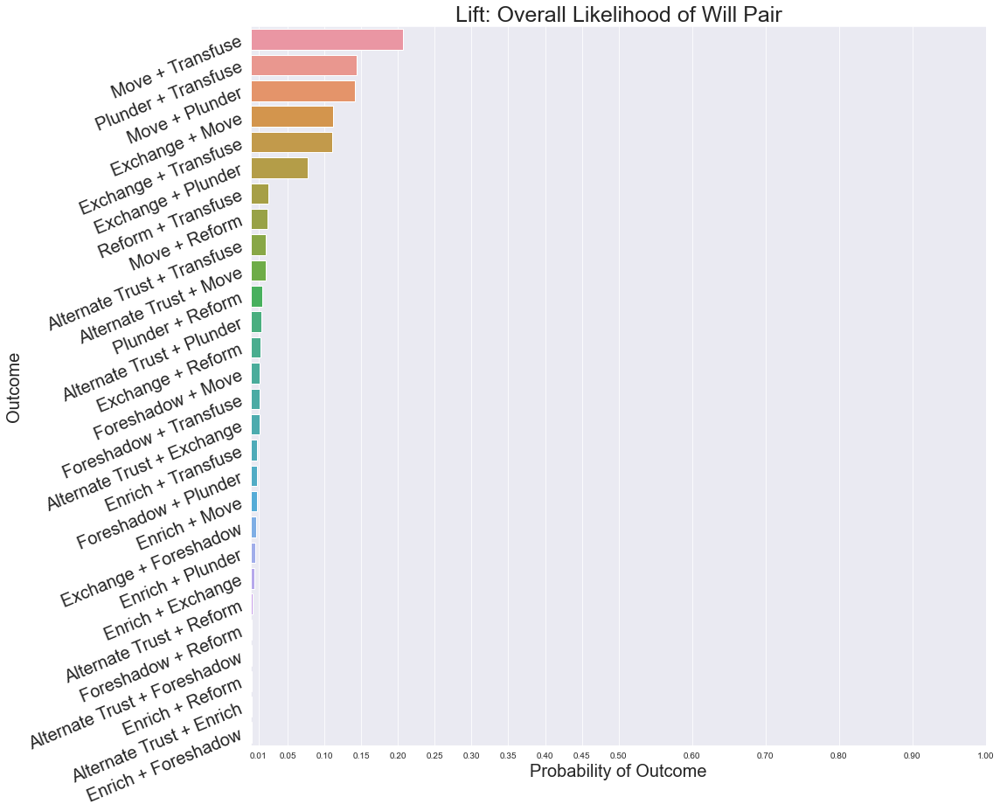

...

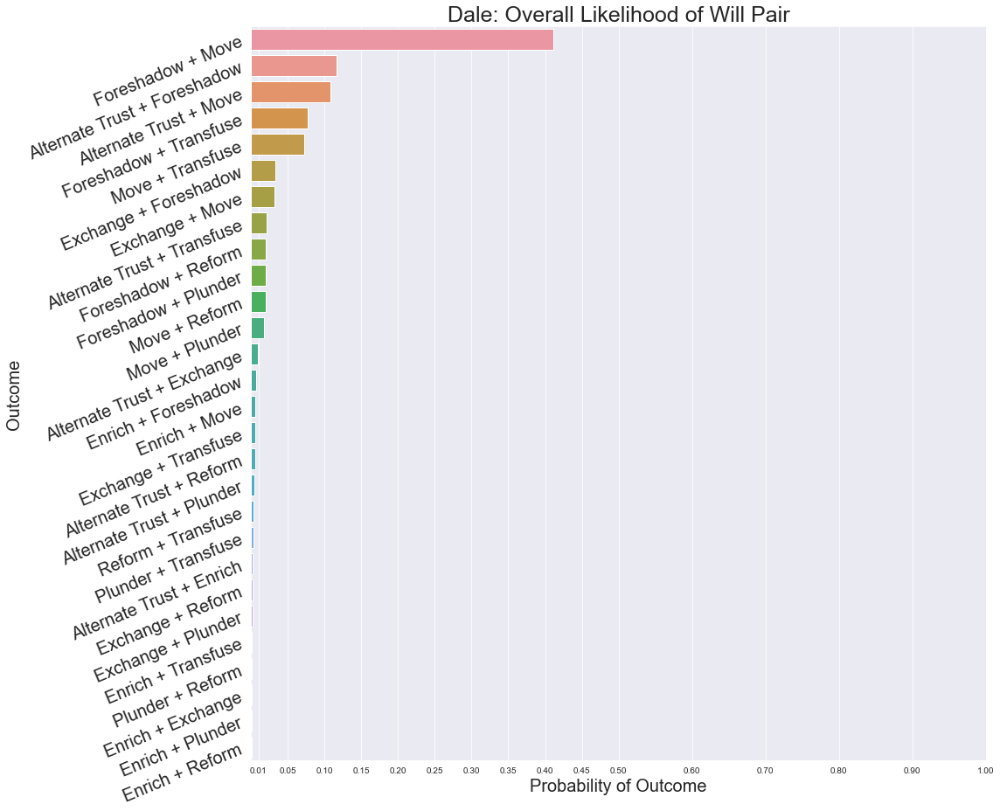

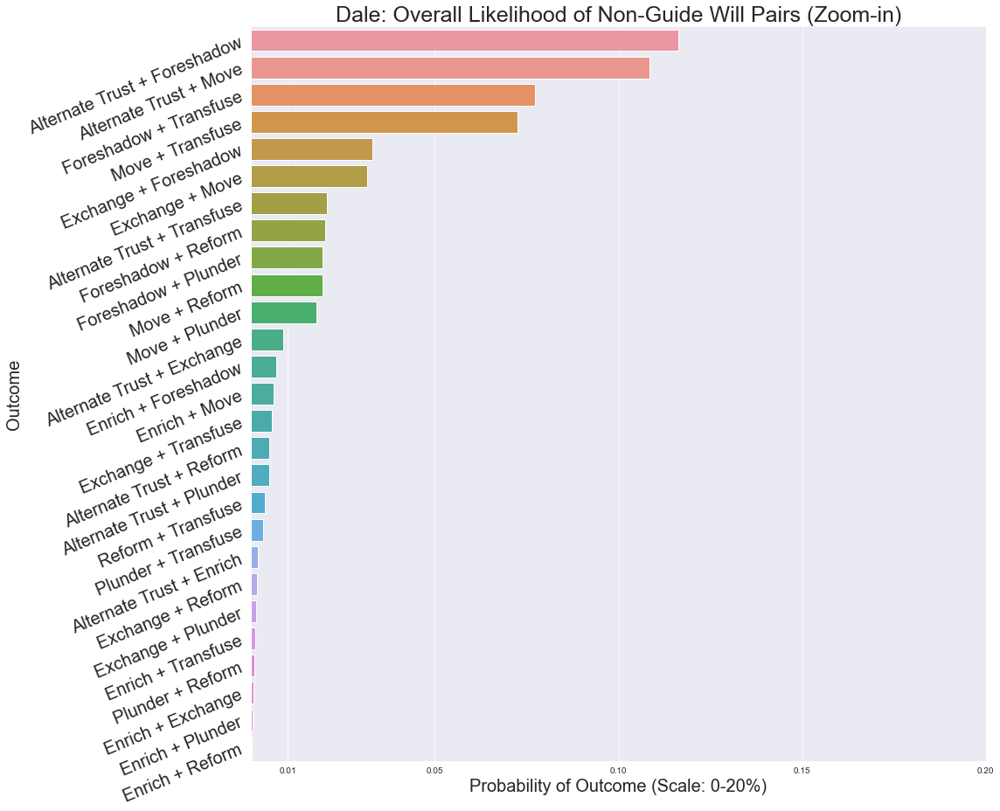

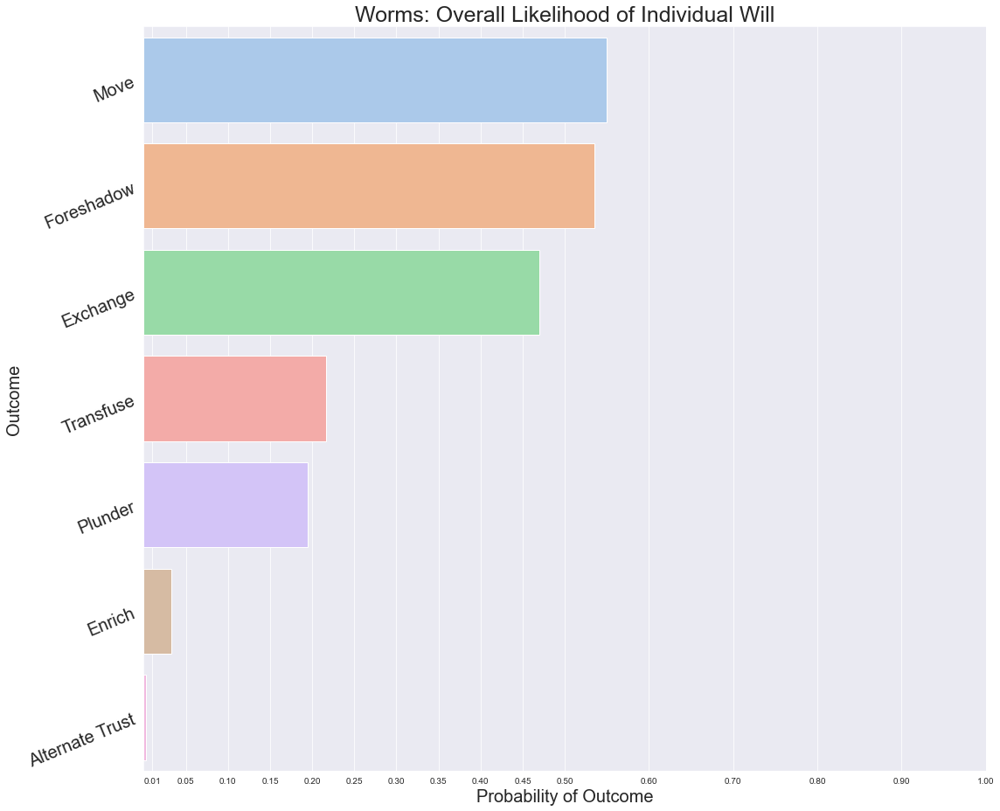

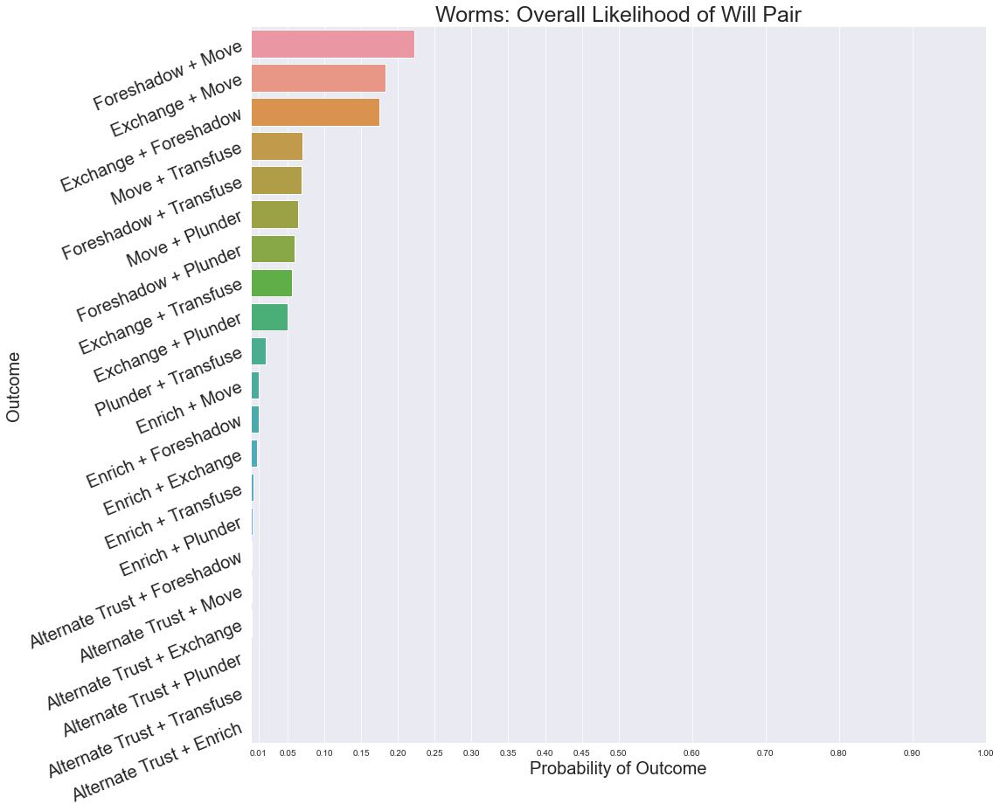

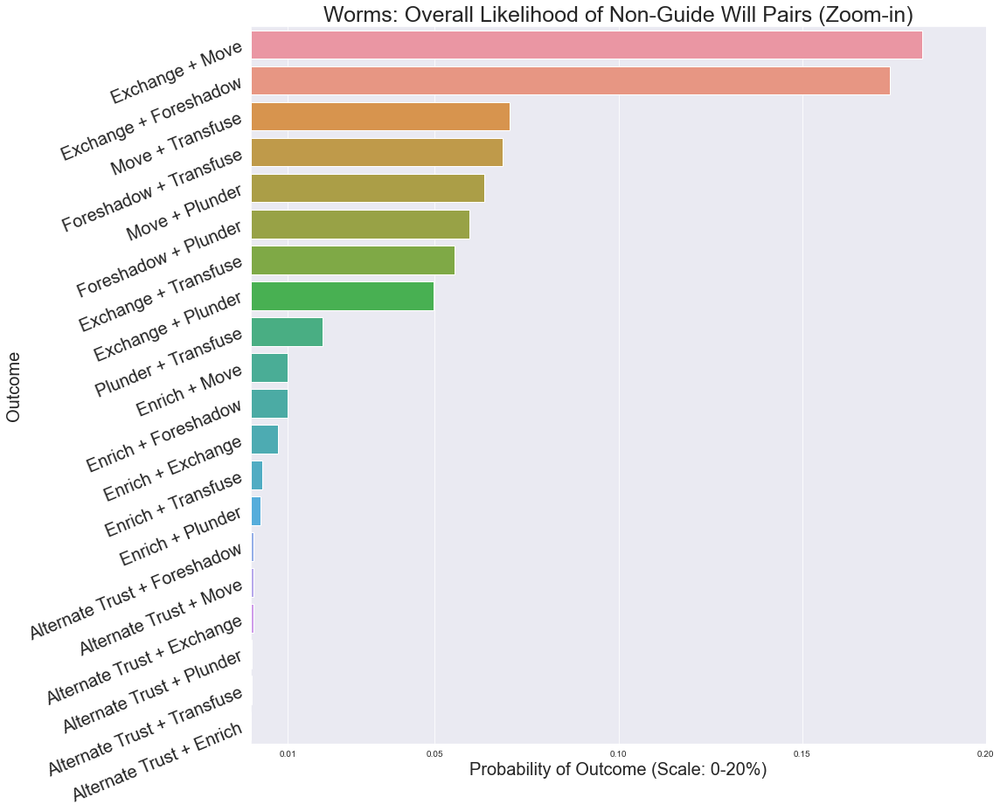

In [11]:
main()